# ShapeUpLMD Behavior Demonstration

In [1]:
import halo_shape_functions as hsf

import shapely
import matplotlib.pyplot as plt

from functools import partial

from pathlib import Path

### Read in Files

In [2]:
# Base folder 
base_path = Path("data")

# using wsi_analysis_demo.svs
image_location = base_path / "wsi_analysis_demo.svs"
annotation_file = base_path / "wsi_analysis_demo.annotations"

# using 'unbiased' example
unb_image_location = base_path / "wsi_unbiased_analysis_demo.svs"
unb_annotation_file = base_path / "wsi_unbiased_analysis_demo.annotations"

# Define annotation layer names used in the annotation files
tumor_layer = 'tumor'
tissue_layer = 'tissue'
calibration_layer = 'calib'
# Parse layers into MultiPolygons
tumor_poly = hsf.parse_annotation_file(tumor_layer, annotation_file)
tissue_poly = hsf.parse_annotation_file(tissue_layer, annotation_file)
calib_layer = hsf.parse_annotation_file(calibration_layer, annotation_file)

#Bounding box rectangle around all polygons for image polygon overlays
outer_geom = tissue_poly.envelope
# Parse tissue and calibration layers
unb_tissue_poly = hsf.parse_annotation_file(tissue_layer, unb_annotation_file)
unb_calib_layer = hsf.parse_annotation_file(calibration_layer, unb_annotation_file)
# unb_tumor_poly = hsf.parse_annotation_file(tumor_layer, unb_annotation_file) # no tumor annotation layer

unb_outer_geom = unb_tissue_poly.envelope

## First step: Negative Regions / Holes
Negative regions are unwanted (not to be collected) regions which are completely envoloped by regions which should be collected.

Negative regions are dealt with by connecting them to a non-collected region such that the negative region will stay connected to the web of non-collected regions.

Let's make a shape which we want to collect which has two negative regions inside of it.

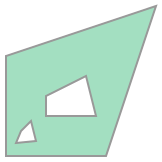

In [3]:
mask_with_negative_region = shapely.Polygon([(0, 0), (0, 100), (150, 150), (100, 0)], holes=[[(40, 40), (40, 60), (80, 80), (90, 40)], [(10, 13), (15, 25), (25, 35), (30, 15)]])
mask_with_negative_region

We want to collect the colored shape and leave out everything else.

To demonstrate, we are assuming 1 µm per pixel (mpp = 1) and no minimum shape size. We will use a maximum shape size larger than our example shape so we just demonstrate connecting negative regions without chopping the shape up further.

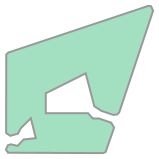

In [4]:
polygons = hsf.make_shapes_lmdable(1, shapely.MultiPolygon([mask_with_negative_region]), 0, 1000*1000, 8)
polygons

The resulting shape now contains no negative regions (no holes), so collecting it is possible with the LMD scope.

Regions are removed based on their proximity to the positive region's exterior to try and maximize collection yield.

We can see the connectors change their position if we change the shapes of the negative regions.

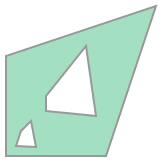

In [5]:
mask_with_negative_region = shapely.Polygon([(0, 0), (0, 100), (150, 150), (100, 0)], holes=[[(40, 45), (40, 60), (80, 110), (90, 40)], [(10, 10), (15, 25), (25, 35), (30, 9)]])
mask_with_negative_region

In [6]:
cutout = shapely.Polygon(mask_with_negative_region.interiors[0])

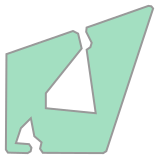

In [7]:
polygons = hsf.make_shapes_lmdable(1, hsf.MultiPolygon([mask_with_negative_region]), 0, 1000*1000,
                                   minimum_micrometers_between_shapes=8)
polygons

A quick aside- the shapes have been simplified a bit with the default arguments. Let's see what it looks like without simplification.

Simplification of the shapes speeds up operations by a ton, both when computing the shapes, and when cutting them on the scope.

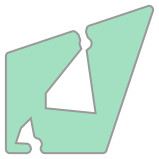

In [8]:
polygons = hsf.make_shapes_lmdable(1, hsf.MultiPolygon([mask_with_negative_region]), 0, 1000*1000,
                                   minimum_micrometers_between_shapes=8, 
                                   simplify=None)
polygons

And with a whole real tissue example.

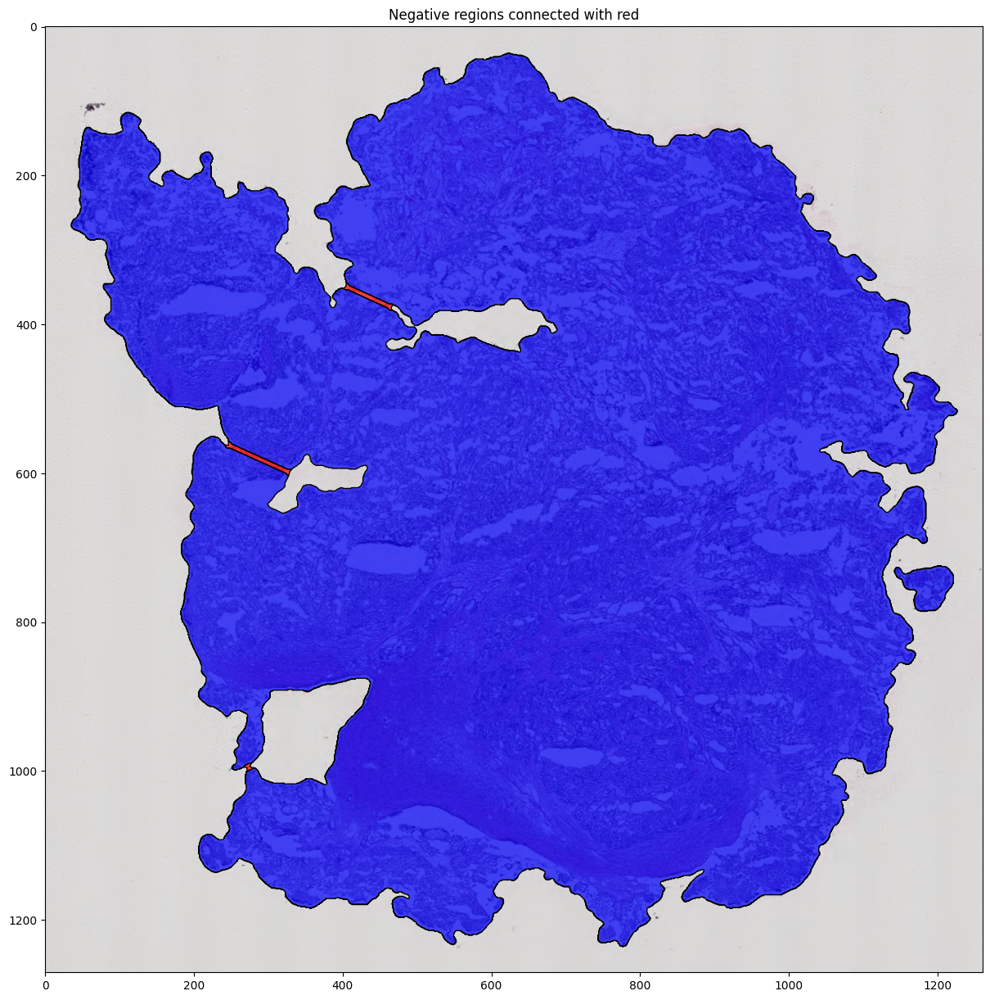

In [9]:
polygons = hsf.make_shapes_lmdable(image_location, tissue_poly, 0, 1000000*1000000,
                                   minimum_micrometers_between_shapes=60)
stuff = hsf.plot_shapes_onto_tissue({1: tissue_poly - polygons, 0: polygons}, image_location, tissue_poly, cmap='bwr')
plt.title('Negative regions connected with red')
plt.show()

And now with the tumor regions - changing the tolerance for speed.

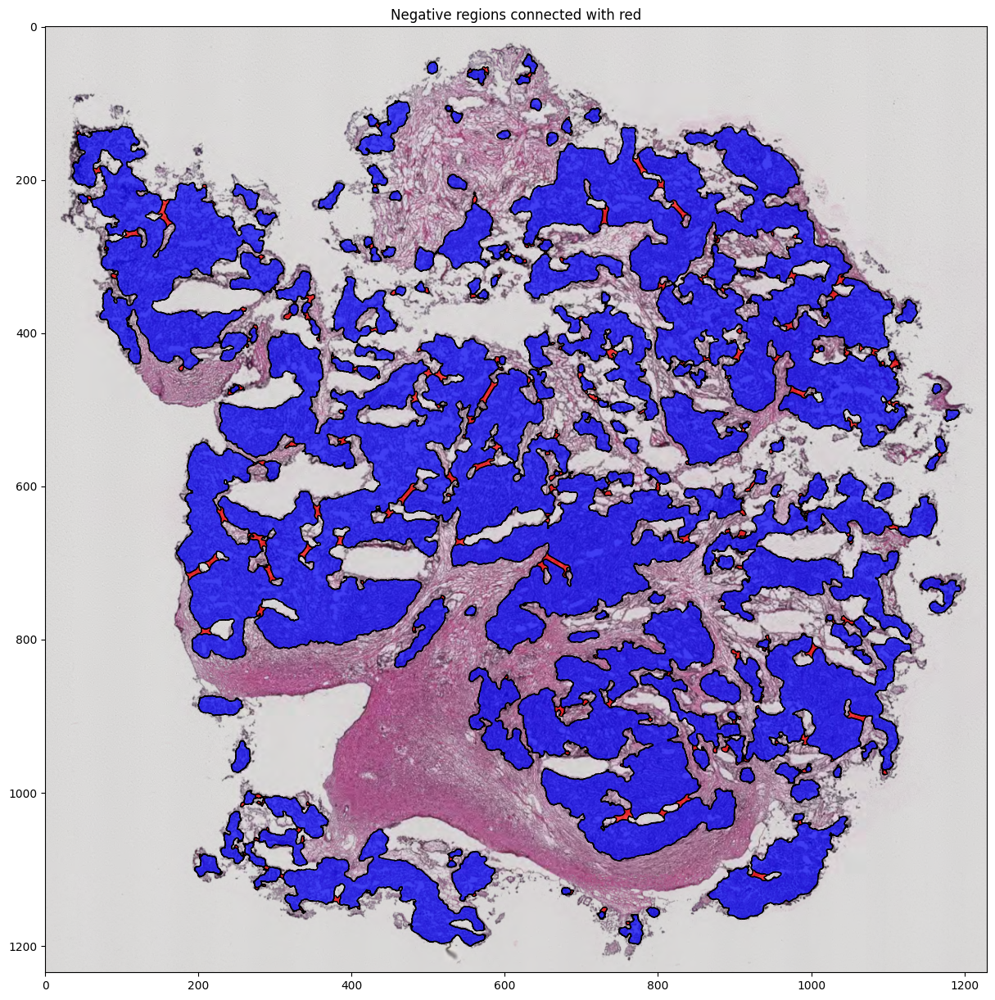

In [10]:
polygons = hsf.make_shapes_lmdable(image_location, tumor_poly, 0, 1000000*1000000, 
                                   minimum_micrometers_between_shapes=60, 
                                   simplify=partial(shapely.simplify, tolerance=5, preserve_topology=True))
stuff = hsf.plot_shapes_onto_tissue({1: tumor_poly - polygons, 0: polygons}, image_location, tumor_poly, cmap='bwr')
plt.title('Negative regions connected with red')
plt.show()

There are some other regions which are being removed because they are thinner than the provided `minimum_micrometers_between_shapes` in this case.

And for the 'unbiased' collection sample tissue:

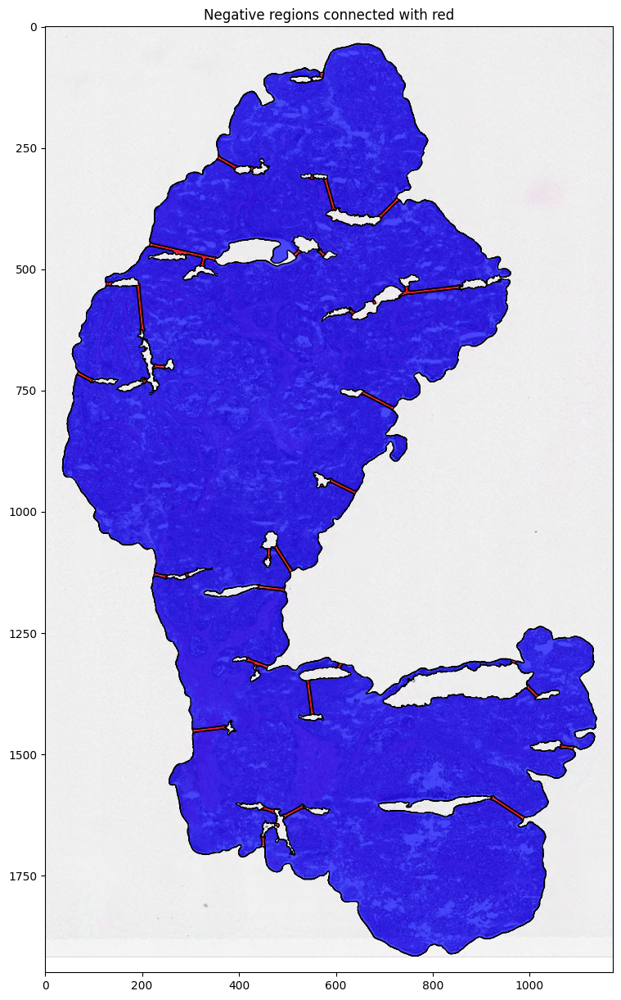

In [11]:
polygons = hsf.make_shapes_lmdable(unb_image_location, unb_tissue_poly, 100*100, 1000000*1000000, 
                                   minimum_micrometers_between_shapes=60)
stuff = hsf.plot_shapes_onto_tissue({1: unb_tissue_poly - polygons, 0: polygons}, unb_image_location, unb_tissue_poly, cmap='bwr')
plt.title('Negative regions connected with red')
plt.show()

## Next Step: Divide Large Regions
Collecting shapes that are too large causes problems with tissue peeling off the slide. Shapes are divided into smaller shapes by testing a provided amount of vertical slices and horizontal slices, and then choosing the slice which preserves the most yield (cuts out the least amount of tissue which should be collected).

Let's take a look at how this happens with our toy example.

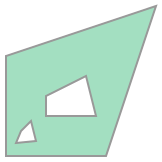

In [12]:
mask_with_negative_region = shapely.Polygon([(0, 0), (0, 100), (150, 150), (100, 0)], holes=[[(40, 40), (40, 60), (80, 80), (90, 40)], [(10, 13), (15, 25), (25, 35), (30, 15)]])
mask_with_negative_region

First, without the splitting (large `maximum_micrometers_squared`)

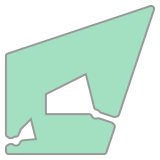

In [33]:
hsf.make_shapes_lmdable(1, shapely.MultiPolygon([mask_with_negative_region]), 0, 
                        maximum_micrometers_squared=1000*1000,
                        minimum_micrometers_between_shapes=6,
                        simplify=None)

Then, with splitting (reasonable `maximum_micrometers_squared`)

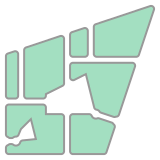

In [32]:
hsf.make_shapes_lmdable(1, shapely.MultiPolygon([mask_with_negative_region]), 0, 
                        maximum_micrometers_squared=50*50,
                        minimum_micrometers_between_shapes=6,
                        simplify=None)

And now, with some real examples.

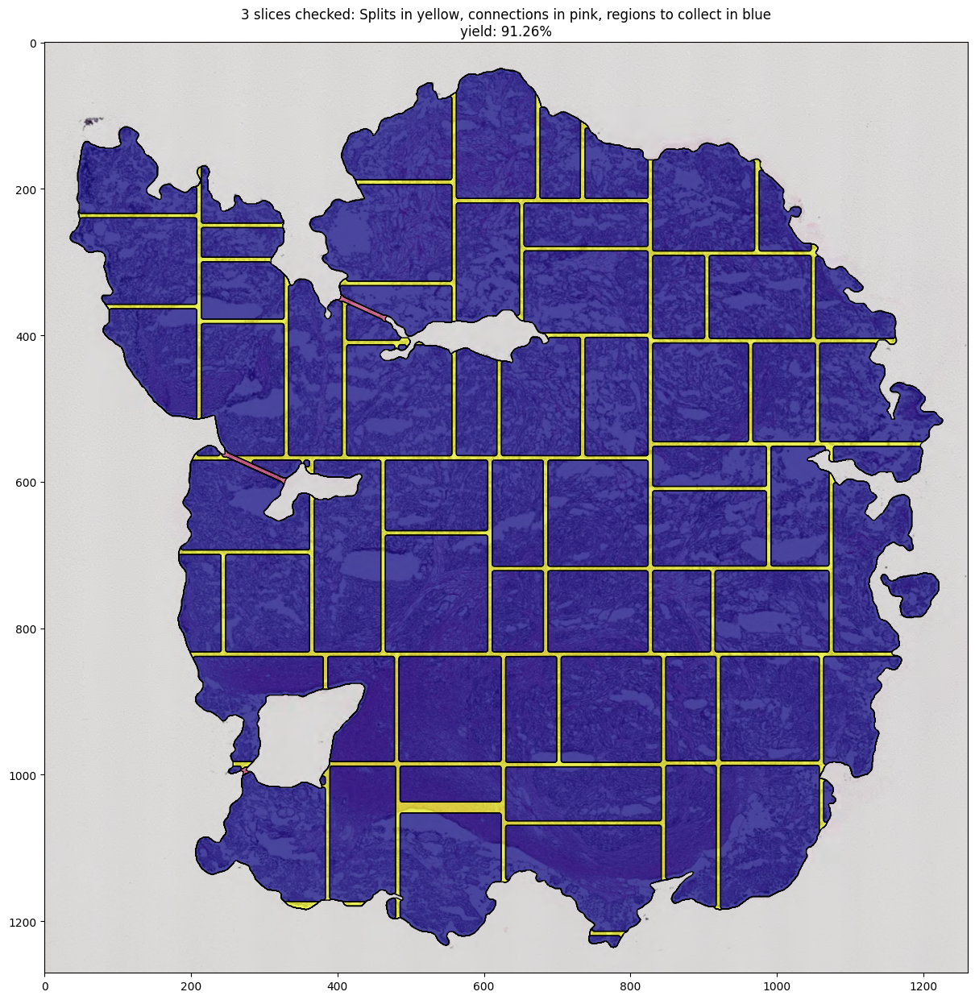

In [57]:
number_of_slices_to_check = 3

just_connections = hsf.make_shapes_lmdable(image_location, tissue_poly, 0, 10000000*10000000,
                                   minimum_micrometers_between_shapes=60,
                                   simplify=partial(shapely.simplify, tolerance=5, preserve_topology=True))
connections_and_splits = hsf.make_shapes_lmdable(image_location, tissue_poly, 0, 1500*1500,
                                   minimum_micrometers_between_shapes=60,
                                   n_slices_to_check=number_of_slices_to_check,
                                   simplify=partial(shapely.simplify, tolerance=5, preserve_topology=True))

connections = tissue_poly - just_connections
just_splits = tissue_poly - connections_and_splits - connections

yld = 1-((tissue_poly.area - connections_and_splits.area)/tissue_poly.area)

stuff = hsf.plot_shapes_onto_tissue({1: just_splits, 0.5: connections, 0: connections_and_splits}, image_location, tissue_poly, cmap='plasma')
plt.title(f'{number_of_slices_to_check} slices checked: Splits in yellow, connections in pink, regions to collect in blue\nyield: {yld*100:.2f}%')
plt.show()

Let's see if we can get a higher yield by increasing the number of slices to check.

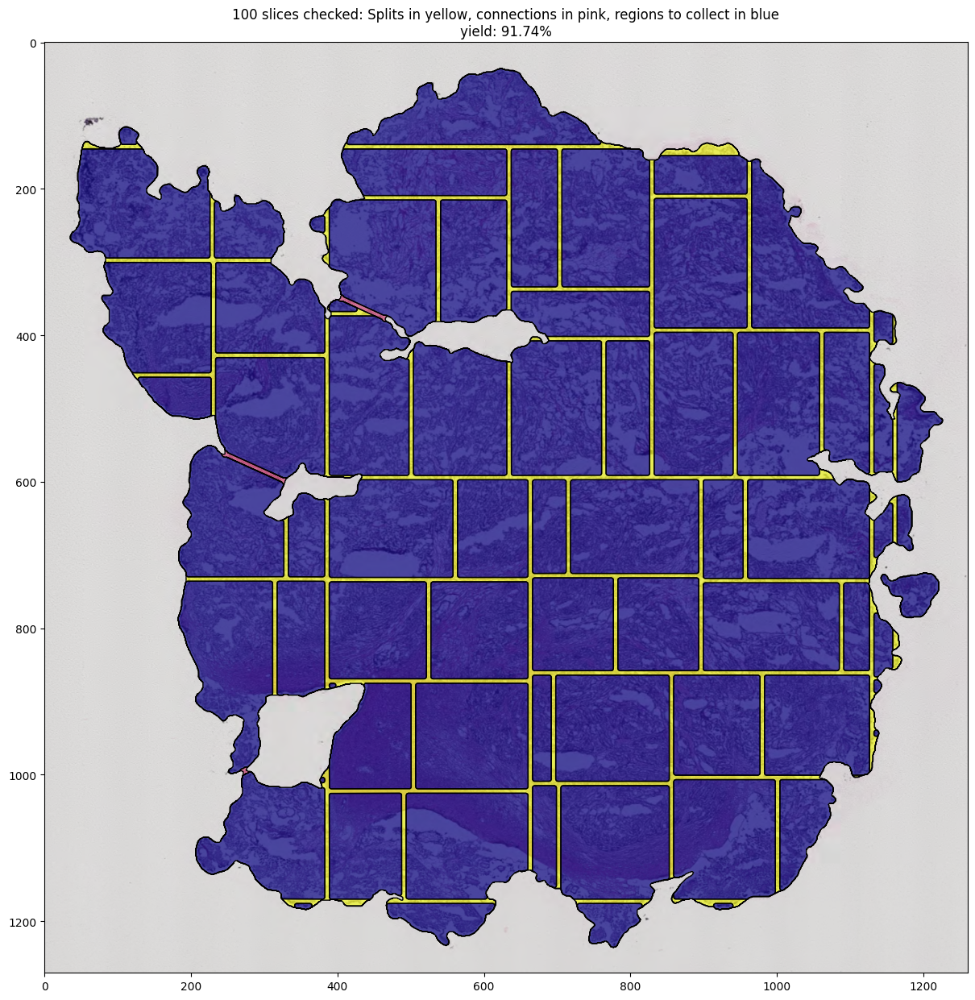

In [58]:
number_of_slices_to_check = 100

just_connections = hsf.make_shapes_lmdable(image_location, tissue_poly, 0, 10000000*10000000,
                                   minimum_micrometers_between_shapes=60,
                                   simplify=partial(shapely.simplify, tolerance=5, preserve_topology=True))
connections_and_splits = hsf.make_shapes_lmdable(image_location, tissue_poly, 0, 1500*1500,
                                   minimum_micrometers_between_shapes=60,
                                   n_slices_to_check=number_of_slices_to_check,
                                   simplify=partial(shapely.simplify, tolerance=5, preserve_topology=True))

connections = tissue_poly - just_connections
just_splits = tissue_poly - connections_and_splits - connections

yld = 1-((tissue_poly.area - connections_and_splits.area)/tissue_poly.area)

stuff = hsf.plot_shapes_onto_tissue({1: just_splits, 0.5: connections, 0: connections_and_splits}, image_location, tissue_poly, cmap='plasma')
plt.title(f'{number_of_slices_to_check} slices checked: Splits in yellow, connections in pink, regions to collect in blue\nyield: {yld*100:.2f}%')
plt.show()

Ever so slightly higher yield. Checking more slices most likely benefits more with more abnormal tissue shapes.

Now let's check how it works with the example tumor regions.

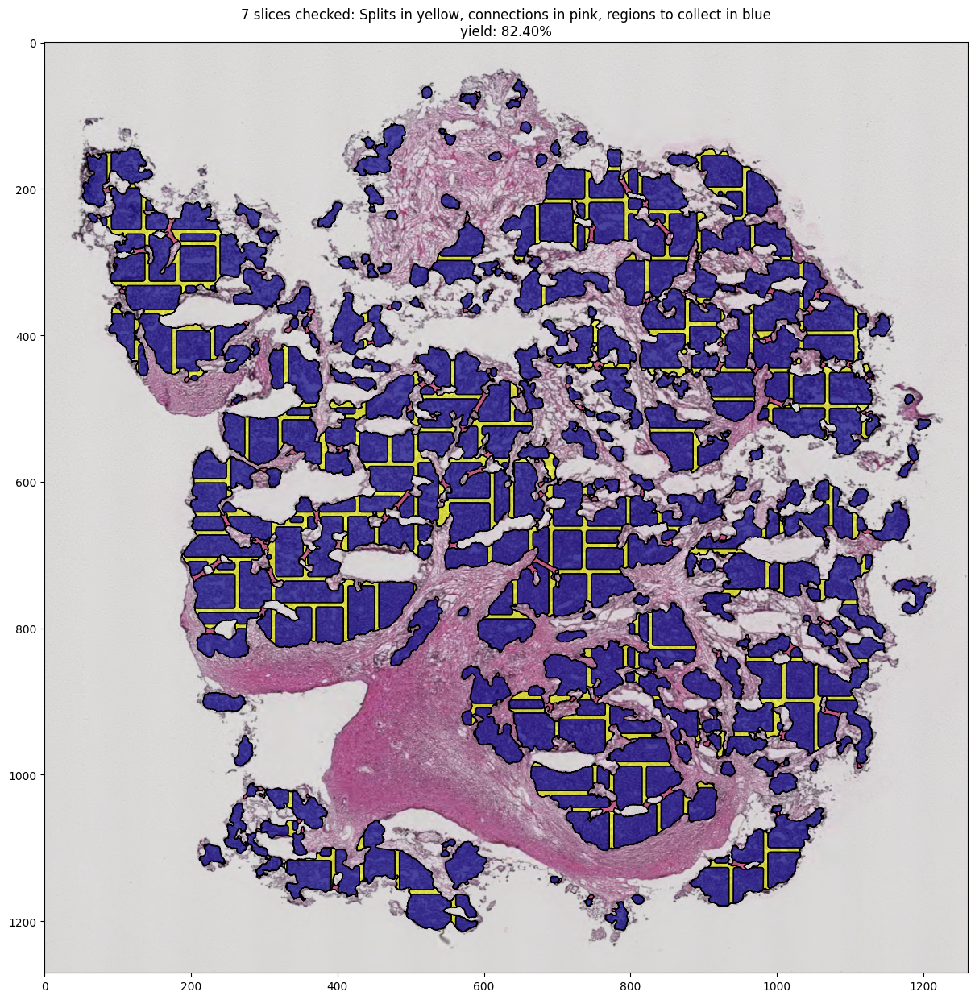

In [66]:
number_of_slices_to_check = 7

just_connections = hsf.make_shapes_lmdable(image_location, tumor_poly, 0, 10000000*10000000,
                                   minimum_micrometers_between_shapes=60,
                                   simplify=partial(shapely.simplify, tolerance=5, preserve_topology=True))
connections_and_splits = hsf.make_shapes_lmdable(image_location, tumor_poly, 0, 500*500,
                                   minimum_micrometers_between_shapes=60,
                                   n_slices_to_check=number_of_slices_to_check,
                                   simplify=partial(shapely.simplify, tolerance=5, preserve_topology=True))

connections = tumor_poly - just_connections
just_splits = tumor_poly - connections_and_splits - connections

yld = 1-((tumor_poly.area - connections_and_splits.area)/tumor_poly.area)

stuff = hsf.plot_shapes_onto_tissue({1: shapely.MultiPolygon(hsf.list_of_shapes_to_polygons(just_splits.geoms)), 0.5: connections, 0: connections_and_splits}, image_location, tissue_poly, cmap='plasma')
plt.title(f'{number_of_slices_to_check} slices checked: Splits in yellow, connections in pink, regions to collect in blue\nyield: {yld*100:.2f}%')
plt.show()

And again with more checked slices.

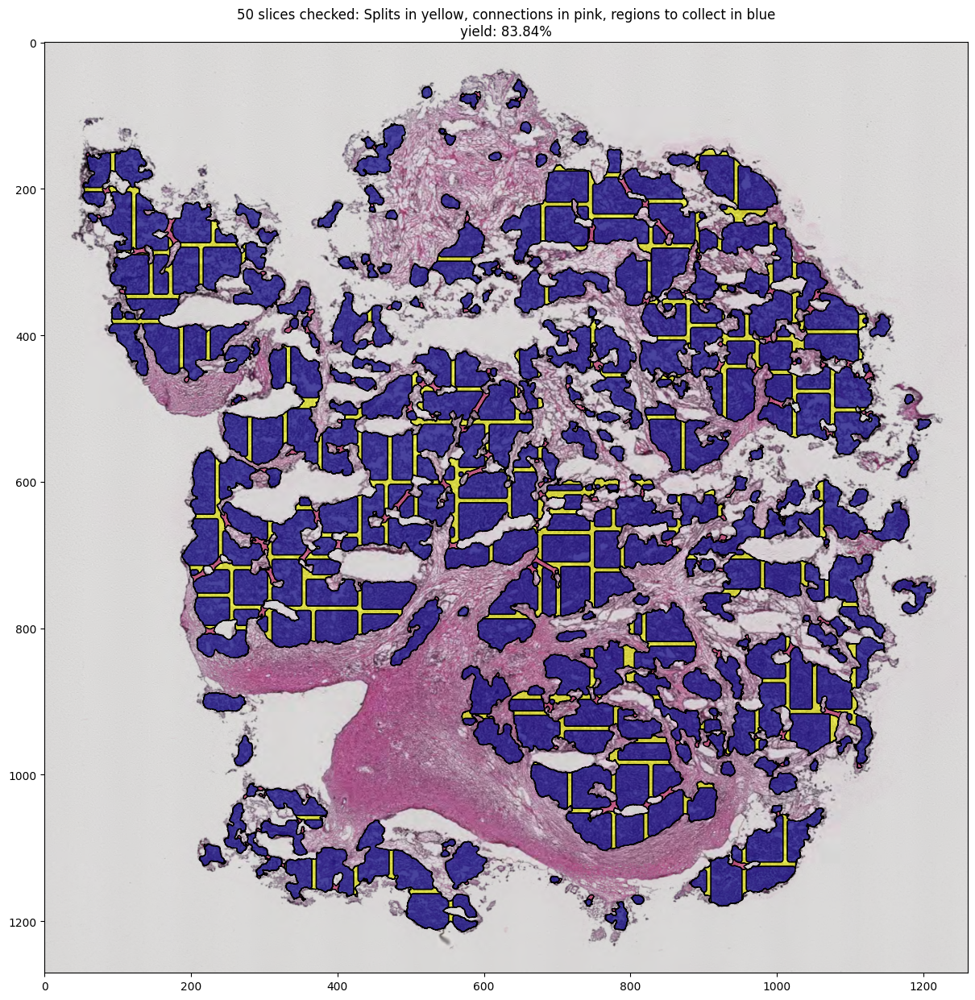

In [67]:
number_of_slices_to_check = 50

just_connections = hsf.make_shapes_lmdable(image_location, tumor_poly, 0, 10000000*10000000,
                                   minimum_micrometers_between_shapes=60,
                                   simplify=partial(shapely.simplify, tolerance=5, preserve_topology=True))
connections_and_splits = hsf.make_shapes_lmdable(image_location, tumor_poly, 0, 500*500,
                                   minimum_micrometers_between_shapes=60,
                                   n_slices_to_check=number_of_slices_to_check,
                                   simplify=partial(shapely.simplify, tolerance=5, preserve_topology=True))

connections = tumor_poly - just_connections
just_splits = tumor_poly - connections_and_splits - connections

yld = 1-((tumor_poly.area - connections_and_splits.area)/tumor_poly.area)

stuff = hsf.plot_shapes_onto_tissue({1: shapely.MultiPolygon(hsf.list_of_shapes_to_polygons(just_splits.geoms)), 0.5: connections, 0: connections_and_splits}, image_location, tissue_poly, cmap='plasma')
plt.title(f'{number_of_slices_to_check} slices checked: Splits in yellow, connections in pink, regions to collect in blue\nyield: {yld*100:.2f}%')
plt.show()